In [9]:
%matplotlib inline

import os
import glob
import pandas as pd
import seaborn as sns
import tables

def read_feat_events(feat_file):
    fid= tables.File(feat_file, 'r')
    
    features_events = {}
    node = fid.get_node('/features_events')
    for worn_n in node._v_children.keys():
        worm_node = fid.get_node('/features_events/' + worn_n)
        
        for feat in worm_node._v_children.keys():
            if not feat in features_events:
                features_events[feat] = {}
            dat = fid.get_node(worm_node._v_pathname, feat)[:]
            features_events[feat][worn_n] = dat
            
    #features_events = {feat:np.concatenate(val) for feat, val in features_events.items()}
    return features_events

results_dir = '/Volumes/behavgenom_archive$/Avelino/test_unc-4/310317/Results/'

assert os.path.exists(results_dir)
feature_files = glob.glob(os.path.join(results_dir, '*_features.hdf5'))

medians_split = pd.DataFrame()
timeseries_data = pd.DataFrame()
features_events = {}
for feat_file in feature_files:
    base_name = os.path.basename(feat_file).replace('_features.hdf5', '')
    base_name = base_name.partition('_Ch1')[0]
    print(base_name)
    with pd.HDFStore(feat_file, 'r') as fid:
        tab = fid['/features_summary/medians_split']
        tab['base_name'] = base_name
        medians_split = pd.concat([medians_split, tab])
        
        
        tab_s = fid['/features_timeseries']
        tab_s['base_name'] = base_name
        timeseries_data = pd.concat([timeseries_data, tab_s])
        
    features_events[base_name] = read_feat_events(feat_file)
        



L4_unc4(e2323)
unc4(e2323)
L4_unc4(e2323)ceh12
unc4(e2323)ceh12


In [6]:
feat_file

'/Volumes/behavgenom_archive$/Avelino/test_unc-4/310317/Results/unc4(e2323)ceh12_Ch1_31032017_121831_features.hdf5'

In [12]:
index_cols = ['worm_index', 'n_frames', 'n_valid_skel', 'first_frame', 'base_name']
feat_cols = [x for x in medians_split.columns if x not in index_cols]

for col in feat_cols:
    print(col)
grouped = medians_split.groupby('base_name')
    



worm_dwelling
head_dwelling
midbody_dwelling
tail_dwelling
length
length_foward
length_paused
length_backward
head_width
head_width_foward
head_width_paused
head_width_backward
midbody_width
midbody_width_foward
midbody_width_paused
midbody_width_backward
tail_width
tail_width_foward
tail_width_paused
tail_width_backward
area
area_foward
area_paused
area_backward
area_length_ratio
area_length_ratio_foward
area_length_ratio_paused
area_length_ratio_backward
width_length_ratio
width_length_ratio_foward
width_length_ratio_paused
width_length_ratio_backward
head_bend_mean
head_bend_mean_abs
head_bend_mean_neg
head_bend_mean_pos
head_bend_mean_foward
head_bend_mean_foward_abs
head_bend_mean_foward_neg
head_bend_mean_foward_pos
head_bend_mean_paused
head_bend_mean_paused_abs
head_bend_mean_paused_neg
head_bend_mean_paused_pos
head_bend_mean_backward
head_bend_mean_backward_abs
head_bend_mean_backward_neg
head_bend_mean_backward_pos
neck_bend_mean
neck_bend_mean_abs
neck_bend_mean_neg
neck_be

In [11]:
with pd.option_context('display.max_rows', None):
    print(medians_split[['base_name', 'worm_index', 'n_frames', 'head_dwelling']])

              base_name  worm_index  n_frames  head_dwelling
0        L4_unc4(e2323)         2.0     952.0       0.797522
1        L4_unc4(e2323)         3.0    7500.0       0.805381
2        L4_unc4(e2323)         3.0    2400.0       0.855591
3        L4_unc4(e2323)         7.0    7500.0     121.160004
4        L4_unc4(e2323)         7.0    7500.0     115.510773
5        L4_unc4(e2323)         7.0    7500.0      18.131140
6        L4_unc4(e2323)         7.0    7500.0     116.231430
7        L4_unc4(e2323)         7.0    7500.0      76.494003
8        L4_unc4(e2323)         7.0    3690.0      43.693333
9        L4_unc4(e2323)        10.0    7500.0       0.842387
10       L4_unc4(e2323)        10.0    7500.0       0.920853
11       L4_unc4(e2323)        10.0    1175.0       1.014452
12       L4_unc4(e2323)        23.0    1125.0       0.722098
13       L4_unc4(e2323)        28.0    1800.0       0.733691
14       L4_unc4(e2323)        35.0    4300.0       0.751748
15       L4_unc4(e2323) 

In [13]:
print(grouped.aggregate({'worm_index':len}))



                     worm_index
base_name                      
L4_unc4(e2323)             31.0
L4_unc4(e2323)ceh12        31.0
unc4(e2323)                38.0
unc4(e2323)ceh12           35.0


/Users/ajaver/miniconda/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


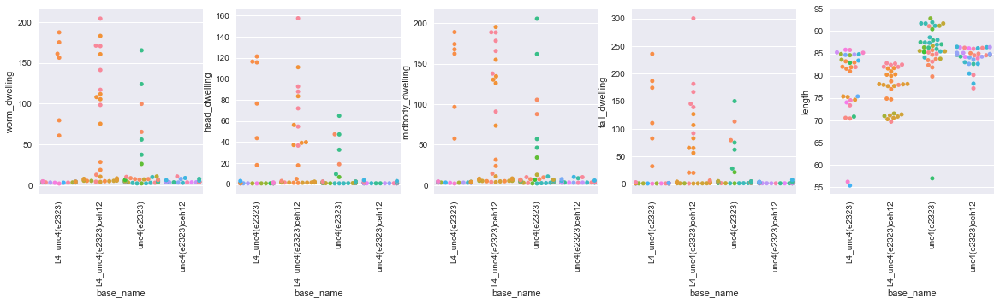

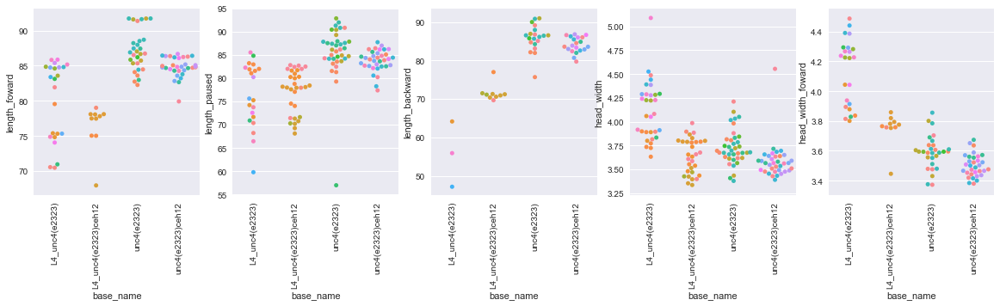

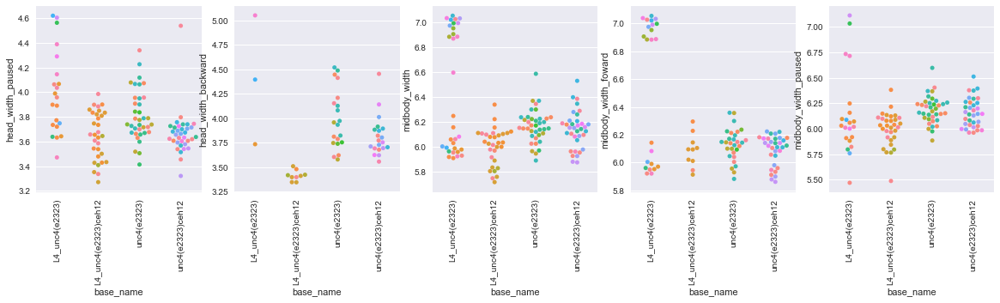

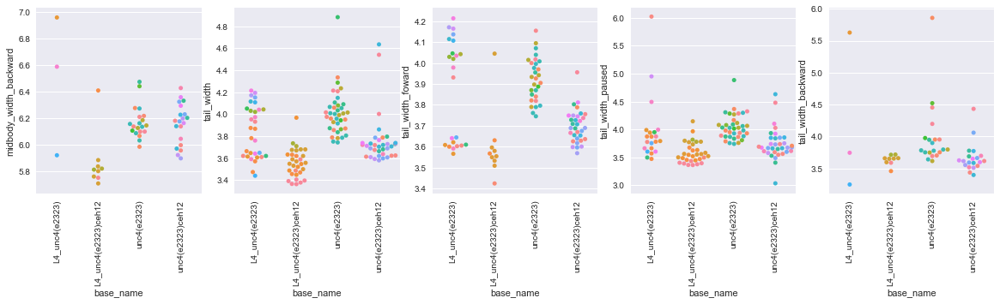

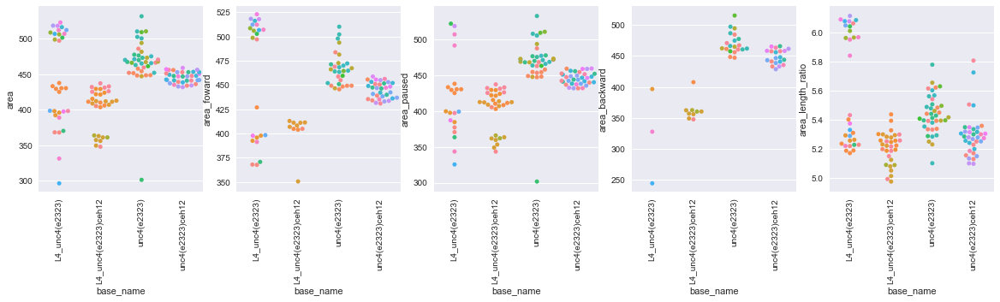

...

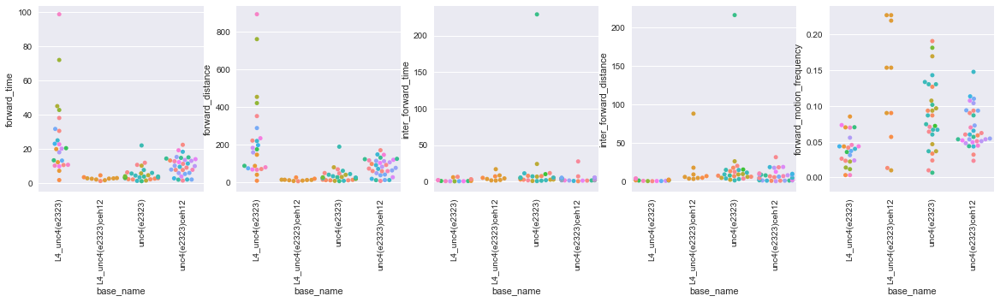

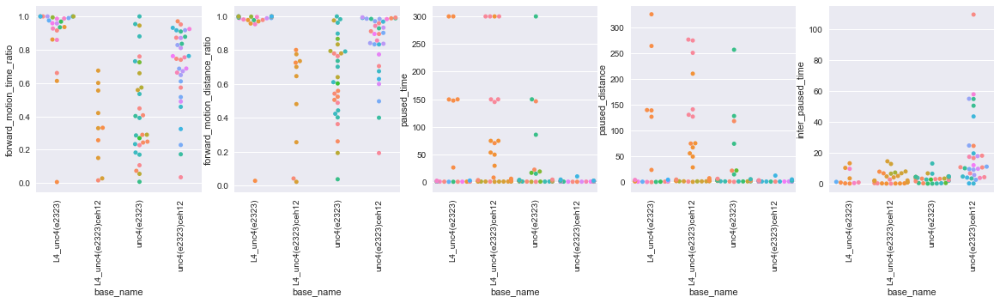

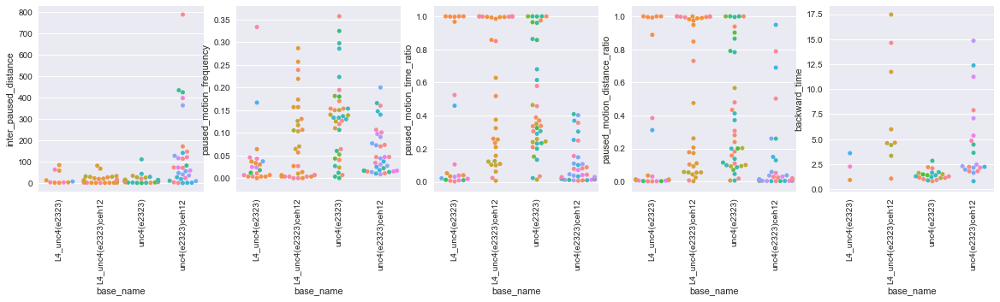

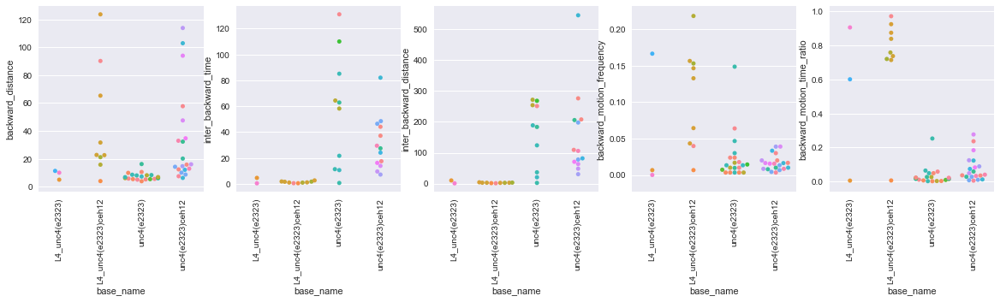

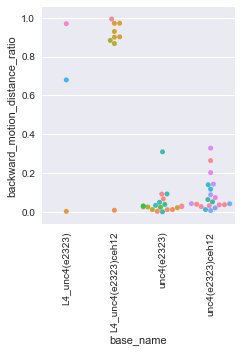

In [18]:
import matplotlib.pylab as plt

lab_oder = sorted(medians_split['base_name'].unique())
lab_oder = ['L4_unc4(e2323)', 'L4_unc4(e2323)ceh12', 'unc4(e2323)', 'unc4(e2323)ceh12']

for icol, col in enumerate(feat_cols):
    if icol % 5==0:
        plt.figure(figsize=(20,4))
    plt.subplot(1, 5, (icol%5)+1)
    ax =sns.swarmplot(x="base_name", y=col, hue='worm_index', data=medians_split, order=lab_oder)
    ax.legend_.remove()
    for item in ax.get_xticklabels():
        item.set_rotation(90)
    #if icol > 200:
    #    break
    
    

/Users/ajaver/miniconda/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


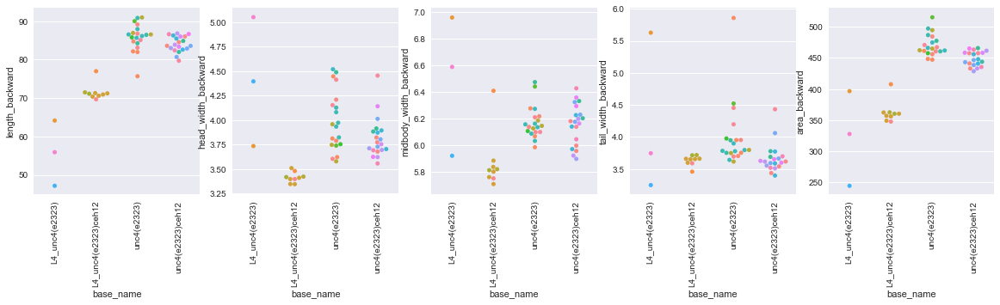

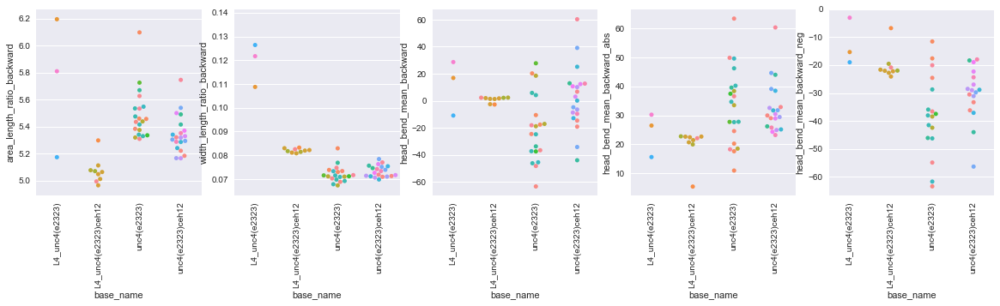

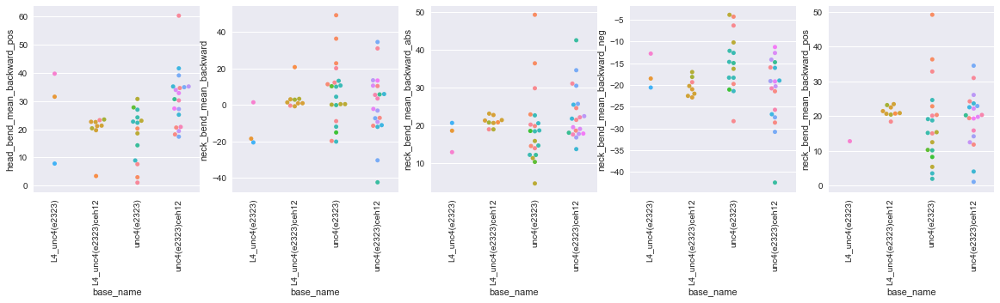

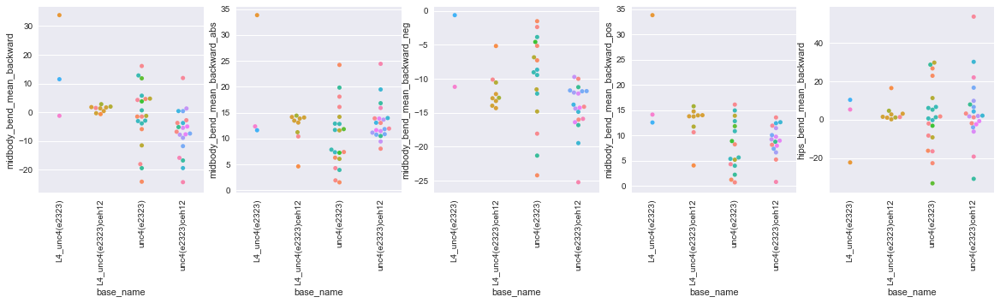

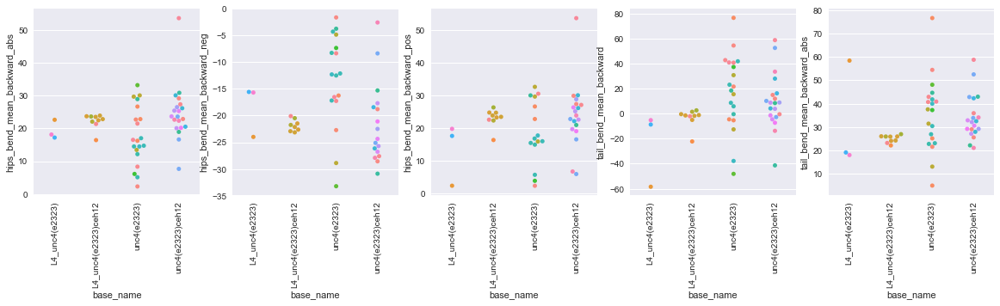

...

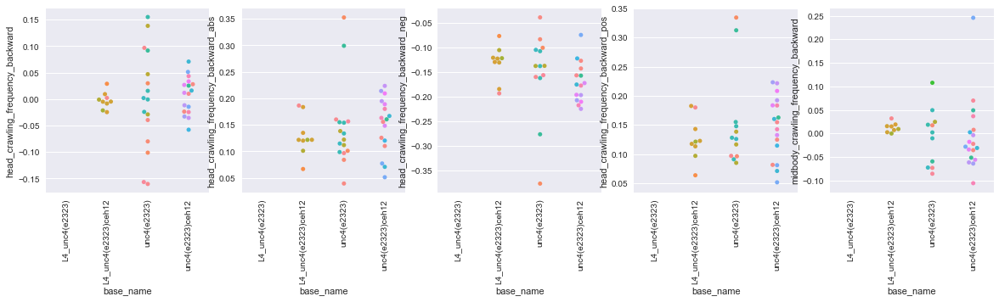

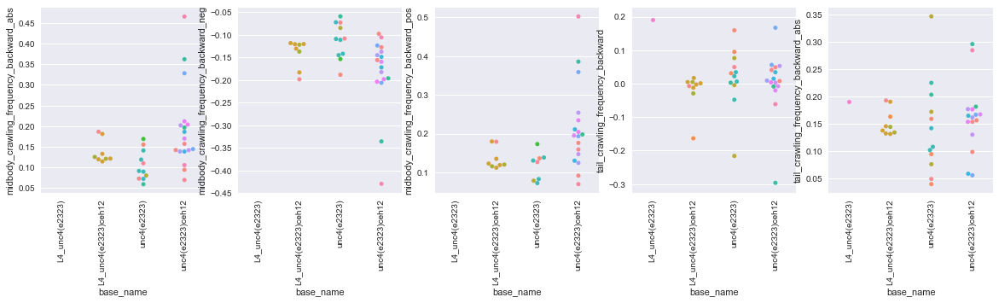

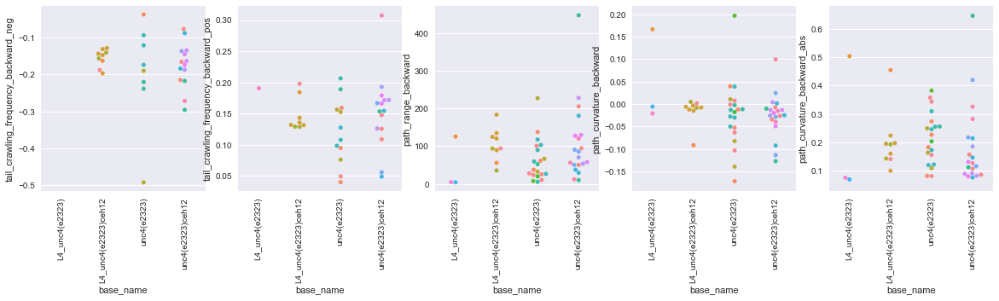

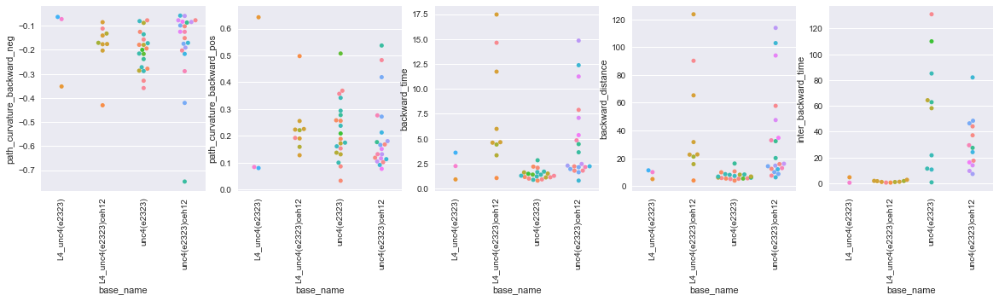

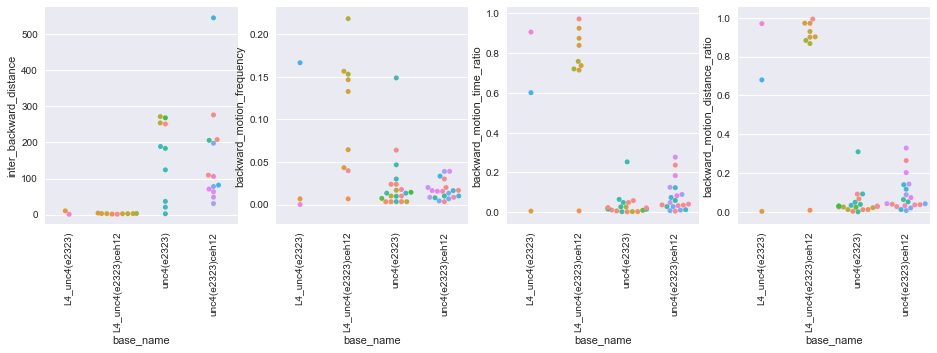

In [17]:
import matplotlib.pylab as plt

lab_oder = ['L4_unc4(e2323)', 'L4_unc4(e2323)ceh12', 'unc4(e2323)', 'unc4(e2323)ceh12']

for icol, col in enumerate([x for x in feat_cols if 'backward' in x]):
    if icol % 5==0:
        plt.figure(figsize=(20,4))
    plt.subplot(1, 5, (icol%5)+1)
    ax =sns.swarmplot(x="base_name", y=col, hue='worm_index', data=medians_split, order=lab_oder)
    ax.legend_.remove()
    for item in ax.get_xticklabels():
        item.set_rotation(90)

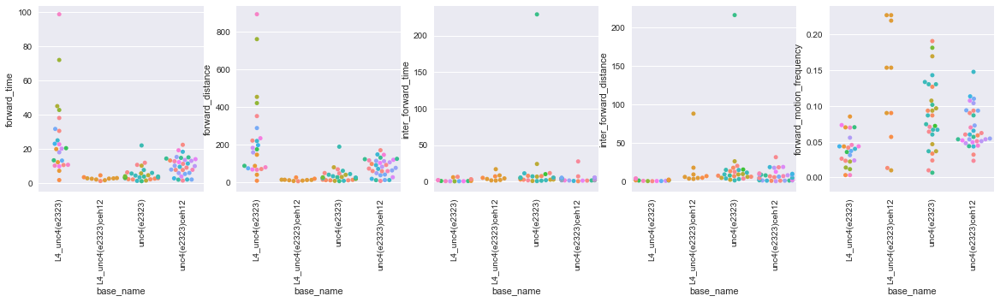

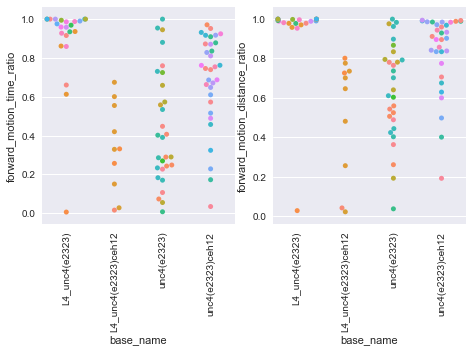

In [20]:
lab_oder = ['L4_unc4(e2323)', 'L4_unc4(e2323)ceh12', 'unc4(e2323)', 'unc4(e2323)ceh12']

for icol, col in enumerate([x for x in feat_cols if 'forward' in x]):
    if icol % 5==0:
        plt.figure(figsize=(20,4))
    plt.subplot(1, 5, (icol%5)+1)
    ax =sns.swarmplot(x="base_name", y=col, hue='worm_index', data=medians_split, order=lab_oder)
    ax.legend_.remove()
    for item in ax.get_xticklabels():
        item.set_rotation(90)

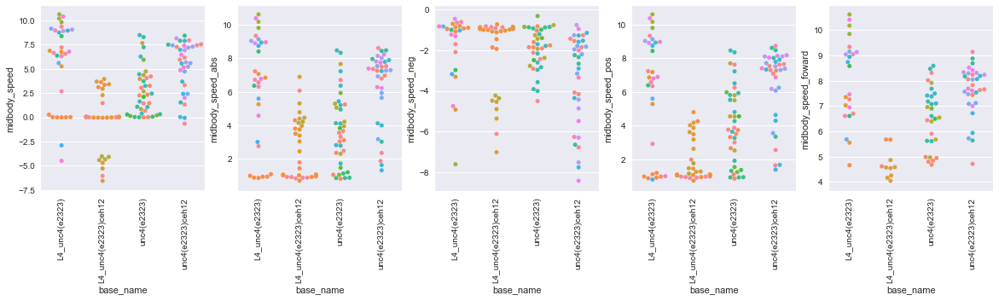

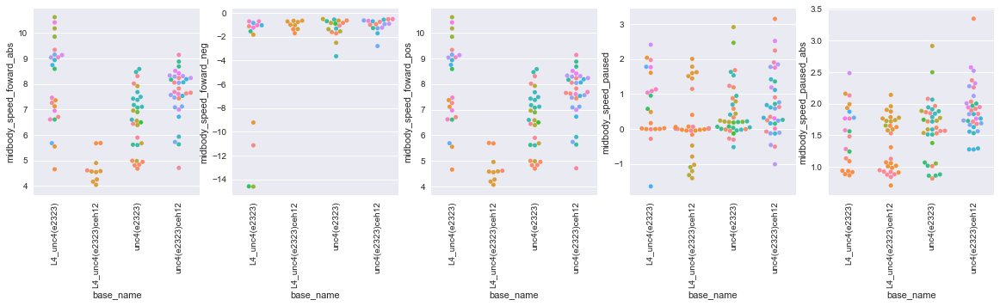

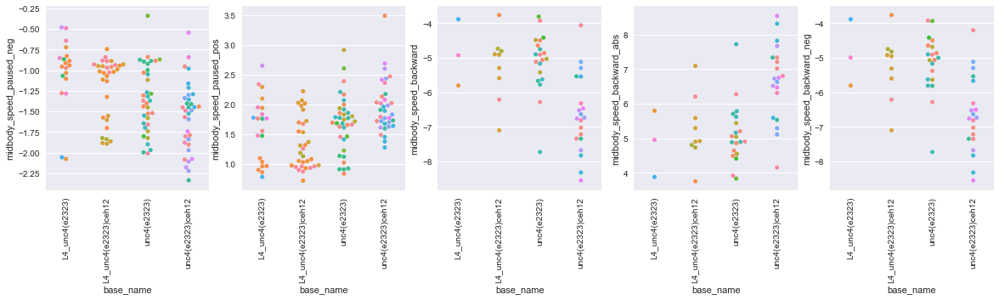

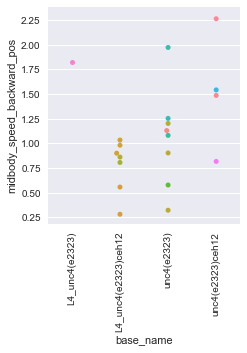

In [23]:
lab_oder = ['L4_unc4(e2323)', 'L4_unc4(e2323)ceh12', 'unc4(e2323)', 'unc4(e2323)ceh12']

for icol, col in enumerate([x for x in feat_cols if 'midbody_speed' in x]):
    if icol % 5==0:
        plt.figure(figsize=(20,4))
    plt.subplot(1, 5, (icol%5)+1)
    ax =sns.swarmplot(x="base_name", y=col, hue='worm_index', data=medians_split, order=lab_oder)
    ax.legend_.remove()
    for item in ax.get_xticklabels():
        item.set_rotation(90)

In [3]:
for col in timeseries_data.columns:
    print(col)

worm_index
timestamp
skeleton_id
motion_modes
length
head_width
midbody_width
tail_width
area
area_length_ratio
width_length_ratio
head_bend_mean
neck_bend_mean
midbody_bend_mean
hips_bend_mean
tail_bend_mean
head_bend_sd
neck_bend_sd
midbody_bend_sd
hips_bend_sd
tail_bend_sd
max_amplitude
amplitude_ratio
primary_wavelength
secondary_wavelength
track_length
eccentricity
bend_count
tail_to_head_orientation
head_orientation
tail_orientation
eigen_projection_1
eigen_projection_2
eigen_projection_3
eigen_projection_4
eigen_projection_5
eigen_projection_6
head_tip_speed
head_speed
midbody_speed
tail_speed
tail_tip_speed
head_tip_motion_direction
head_motion_direction
midbody_motion_direction
tail_motion_direction
tail_tip_motion_direction
foraging_amplitude
foraging_speed
head_crawling_amplitude
midbody_crawling_amplitude
tail_crawling_amplitude
head_crawling_frequency
midbody_crawling_frequency
tail_crawling_frequency
path_range
path_curvature
base_name


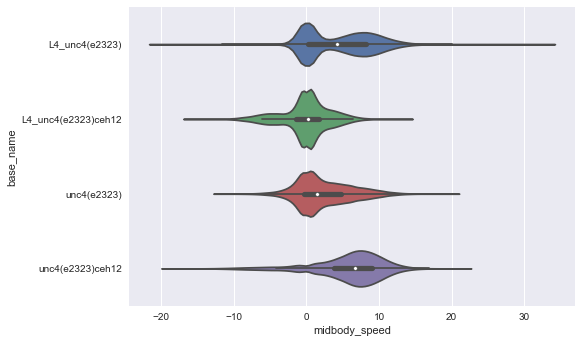

In [5]:
lab_oder = ['L4_unc4(e2323)', 'L4_unc4(e2323)ceh12', 'unc4(e2323)', 'unc4(e2323)ceh12']
sns.violinplot(y="base_name", x="midbody_speed", data=timeseries_data, order=lab_oder)

In [11]:
print(features_events['unc4(e2323)'].keys())

dict_keys(['tail_dwelling', 'upsilon_turns_frequency', 'forward_motion_frequency', 'inter_omega_distance', 'paused_time', 'forward_motion_time_ratio', 'inter_paused_time', 'backward_time', 'inter_coil_time', 'coil_time', 'inter_backward_time', 'omega_turns_frequency', 'backward_distance', 'inter_forward_distance', 'head_dwelling', 'forward_motion_distance_ratio', 'backward_motion_time_ratio', 'inter_upsilon_time', 'backward_motion_frequency', 'inter_coil_distance', 'forward_distance', 'inter_forward_time', 'paused_motion_time_ratio', 'inter_paused_distance', 'coils_time_ratio', 'inter_backward_distance', 'midbody_dwelling', 'paused_motion_distance_ratio', 'omega_turns_time_ratio', 'upsilon_turn_time', 'paused_motion_frequency', 'omega_turn_time', 'paused_distance', 'inter_omega_time', 'upsilon_turns_time_ratio', 'worm_dwelling', 'coils_frequency', 'inter_upsilon_distance', 'backward_motion_distance_ratio', 'forward_time'])


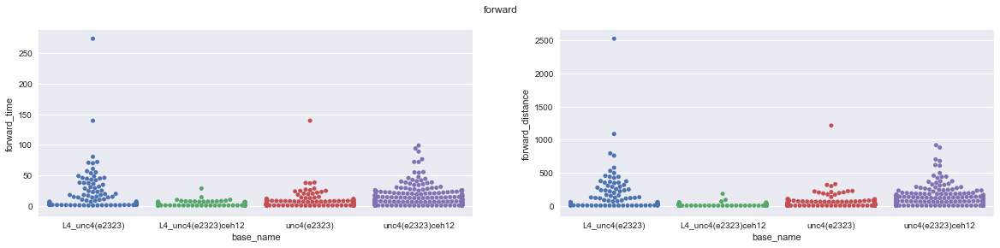

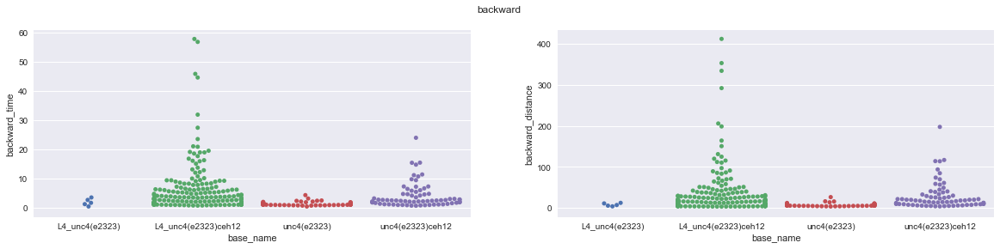

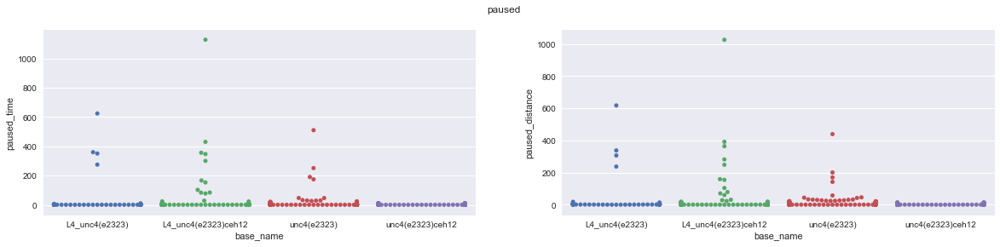

In [45]:
import numpy as np
import matplotlib.pylab as plt

def eventfeat2df(feat):
    dat = []
    for base_name in features_events:
        val = np.concatenate([x for key, x in features_events[base_name][feat].items()])
        df = pd.DataFrame({feat:val})
        df['base_name']  = base_name
        dat.append(df)
    return pd.concat(dat)  



for ftype1 in ['forward', 'backward', 'paused']:
    plt.figure(figsize=(20,4))
    for ii, ftype2 in enumerate(['_time', '_distance']):
        feat = ftype1 + ftype2
        plt.subplot(1,2,ii+1)
        feat_df = feat_df.dropna()
        feat_df = eventfeat2df(feat)
        sns.swarmplot(x="base_name", y=feat, data=feat_df, order=lab_oder)
    plt.suptitle(ftype1)


